<a href="https://colab.research.google.com/github/ngoan22mse23088/ImageVideoProcessing/blob/master/IVP501_Assignment_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# FPT School of Business and Technology (FSB) - FPT University
FPT School of Business (FSB) - FPT University
Class : Master of Software Engineering (MSE12)
Subject : Image Video Processing (IVP501)
Instructor : Dr. Nguyen Ngoc Truong Minh
Student ID : 22MSE23088
Full Name : Le Chi Ngoan


# Home Work 1

**Problem 3_1 Quantization**

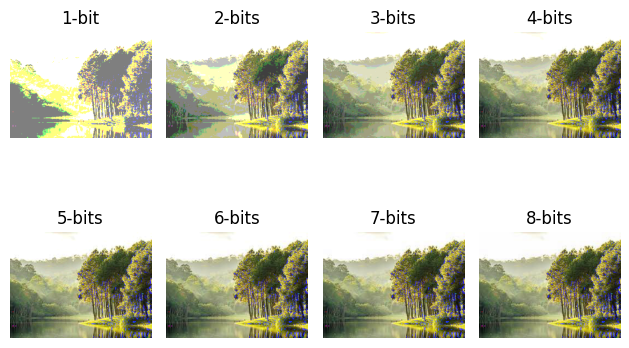

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from urllib.request import urlopen

# Image URL on GitHub
image_url = 'https://github.com/ngoan22mse23088/ImageVideoProcessing/blob/master/Images/nature.jpg?raw=true'

# Download the image
image_data = urlopen(image_url)

# Convert the downloaded data to a PIL Image object
pil_image = Image.open(image_data)

# Convert PIL Image to NumPy array
img = np.array(pil_image)

# Repeat with different number of bits
for no_of_bit in range(1, 9):
    # Quantize to a given number of bits
    no_of_level = 2 ** no_of_bit
    level_gap = 256 / no_of_level

    # Quantization
    quantized_img = np.uint8(np.ceil(img / level_gap) * level_gap - 1)

    # Plot image
    plt.subplot(2, 4, no_of_bit)
    plt.imshow(quantized_img)
    plt.axis('off')

    # Image caption and saving
    if no_of_bit == 1:
        name = str(no_of_bit) + '-bit'
    else:
        name = str(no_of_bit) + '-bits'

    plt.title(name)

plt.tight_layout()
plt.show()


**Problem 3_2 Brightness Adjustment**

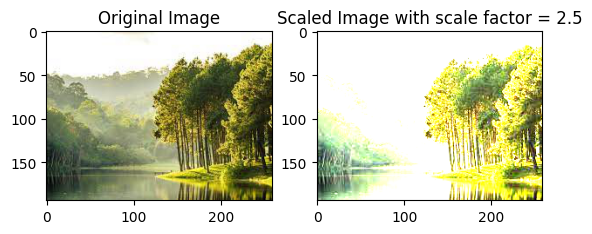

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from urllib.request import urlopen

# Image URL on GitHub
image_url = 'https://github.com/ngoan22mse23088/ImageVideoProcessing/raw/master/Images/nature.jpg'

# Download the image
image_data = urlopen(image_url)

# Convert the downloaded data to a PIL Image object
pil_image = Image.open(image_data)

# Convert PIL Image to NumPy array
img = np.array(pil_image).astype(float) / 255.0

# Brightness adjustment by intensity scaling
scale = 2.5  # Lighter
scaled_img = scale * img

# Plot images
plt.subplot(1, 2, 1)
plt.imshow(img, vmin=0, vmax=1)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(scaled_img, vmin=0, vmax=1)
plt.title('Scaled Image with scale factor = 2.5')

# Save the scaled image
plt.savefig('Brightness_Lighter.jpg')
plt.show()

**Problem 3_3 Add two images**

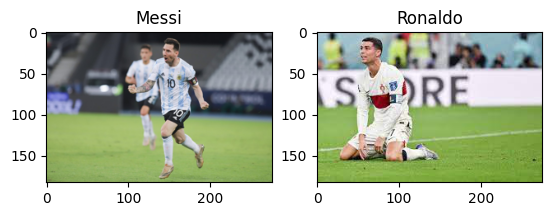

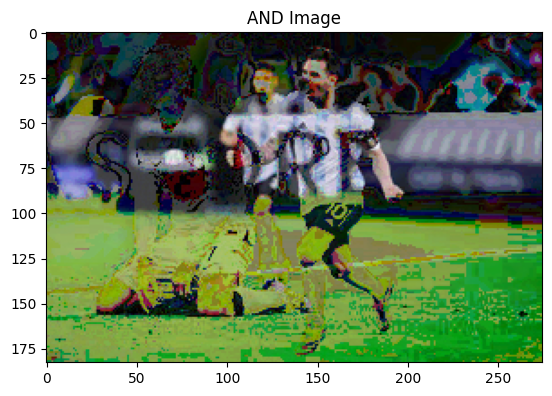

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from urllib.request import urlopen

# URLs of the images on GitHub
image1_url = 'https://github.com/ngoan22mse23088/ImageVideoProcessing/raw/master/Images/messi.jpg'
image2_url = 'https://github.com/ngoan22mse23088/ImageVideoProcessing/raw/master/Images/ronaldo.jpg'

# Download the images
image1_data = urlopen(image1_url)
image2_data = urlopen(image2_url)

# Convert the downloaded data to PIL Image objects
image1 = Image.open(image1_data)
image2 = Image.open(image2_data)

# Resize image1 to match the desired size
desired_size = (275, 183)
image1 = image1.resize(desired_size)

# Convert PIL Images to NumPy arrays
I1 = np.array(image1)
I2 = np.array(image2)

# Perform bitwise AND operation
I_and = np.bitwise_and(I1, I2)

# Plot images
plt.subplot(1, 2, 1)
plt.imshow(I1)
plt.title('Messi')

plt.subplot(1, 2, 2)
plt.imshow(I2)
plt.title('Ronaldo')

plt.figure()
plt.imshow(I_and, cmap='gray', vmin=0, vmax=255)
plt.title('AND Image')

# Save the AND image
plt.savefig('AND_image.jpg')
plt.show()

**Problem 3_4 Contrast Enhancement**

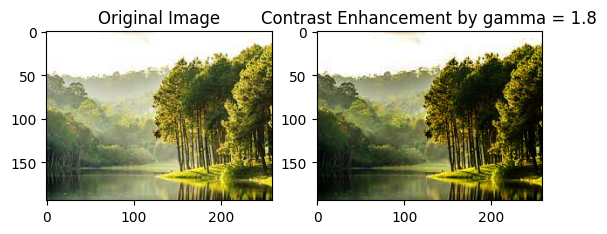

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from urllib.request import urlopen

# Image URL on GitHub
image_url = 'https://github.com/ngoan22mse23088/ImageVideoProcessing/raw/master/Images/nature.jpg'

# Download the image
image_data = urlopen(image_url)

# Convert the downloaded data to a PIL Image object
pil_image = Image.open(image_data)

# Convert PIL Image to NumPy array
img = np.array(pil_image).astype(float) / 255.0

# Contrast enhancement by changing 'gamma' characteristics
# gamma = 1.0  # Unchanged
# gamma = 0.3  # Decrease contrast
gamma = 1.8  # Increase contrast
gamma_img = img ** gamma

# Plot images
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(gamma_img)
plt.title('Contrast Enhancement by gamma = 1.8')

# Save the contrast-enhanced image
plt.savefig('Contrast_Increase.png')
plt.show()

**Problem 3_5 Geometrics Operations**

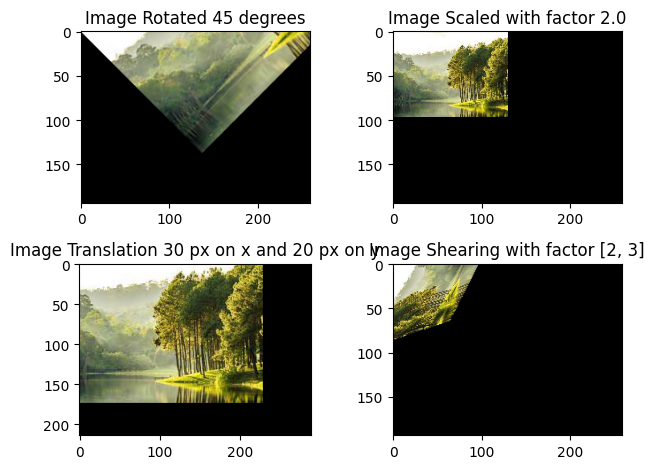

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import warp, AffineTransform

# Load image from Git repository
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/nature.jpg')

# Rotation an angle = 45 degrees
rotation_matrix = np.array([[np.cos(np.deg2rad(45)), -np.sin(np.deg2rad(45)), 0],
                            [np.sin(np.deg2rad(45)), np.cos(np.deg2rad(45)), 0],
                            [0, 0, 1]])
Imga = warp(Img, AffineTransform(matrix=rotation_matrix))
plt.subplot(2, 2, 1)
plt.imshow(Imga)
plt.title('Image Rotated 45 degrees')

# Scaling with a factor = 2.0
scaling_matrix = np.array([[2.0, 0, 0],
                           [0, 2.0, 0],
                           [0, 0, 1]])
Imgb = warp(Img, AffineTransform(matrix=scaling_matrix))
plt.subplot(2, 2, 2)
plt.imshow(Imgb)
plt.title('Image Scaled with factor 2.0')

# Translation 30 pixels on x and 20 pixels on y
translation_matrix = np.array([[1, 0, 30],
                               [0, 1, 20],
                               [0, 0, 1]])
Imgc = warp(Img, AffineTransform(matrix=translation_matrix),
            output_shape=(Img.shape[0]+20, Img.shape[1]+30))
plt.subplot(2, 2, 3)
plt.imshow(Imgc)
plt.title('Image Translation 30 px on x and 20 px on y')

# Shearing
shearing_matrix = np.array([[1, 3, 0],
                            [2, 1, 0],
                            [0, 0, 1]])
Imgd = warp(Img, AffineTransform(matrix=shearing_matrix))
plt.subplot(2, 2, 4)
plt.imshow(Imgd)
plt.title('Image Shearing with factor [2, 3]')

plt.tight_layout()
plt.show()

**Problem 4_1 Contrast Enhancement**

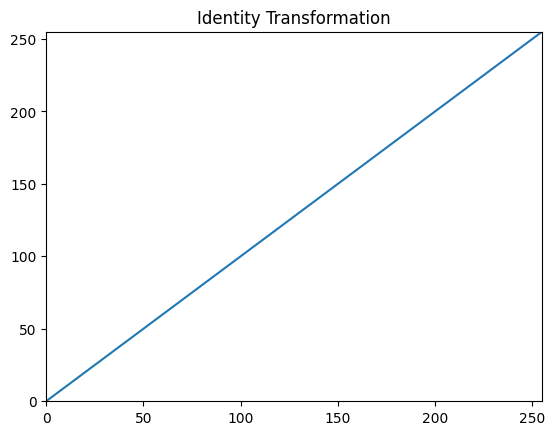

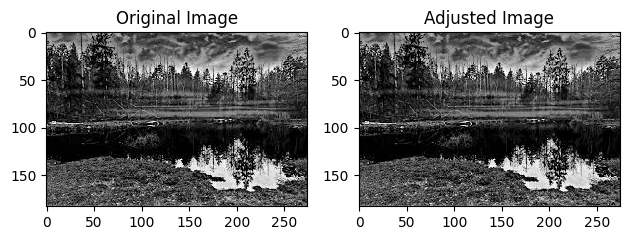

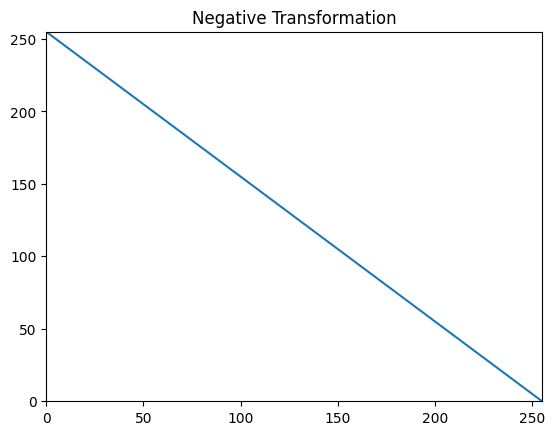

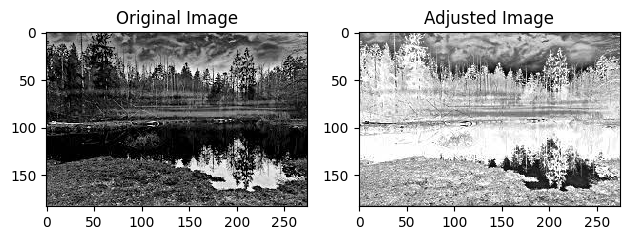

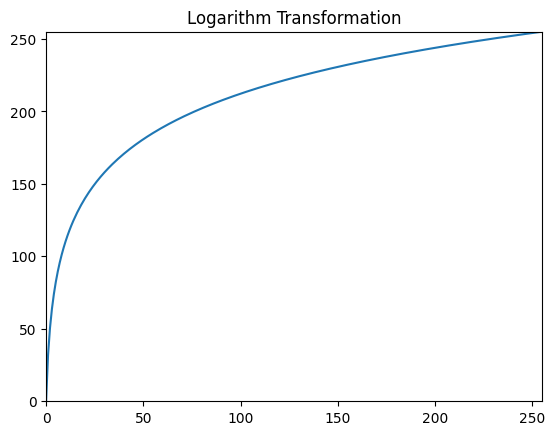

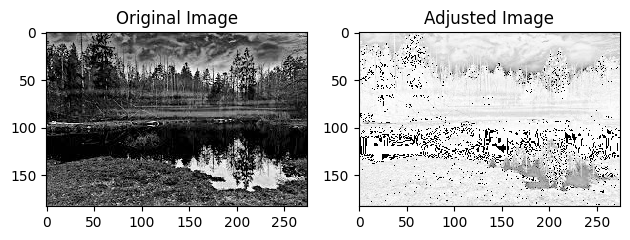

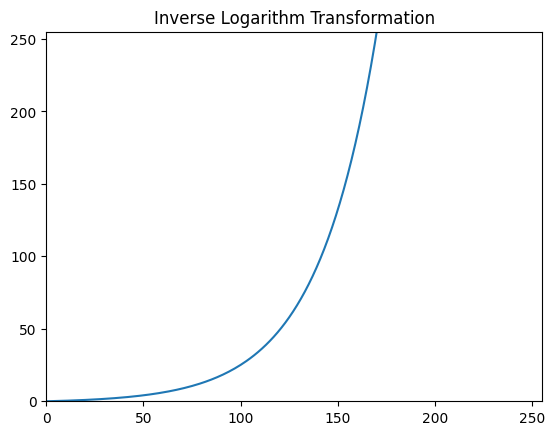

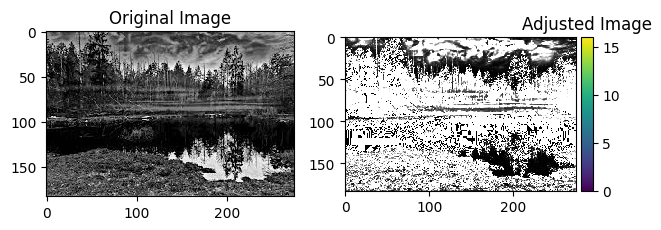

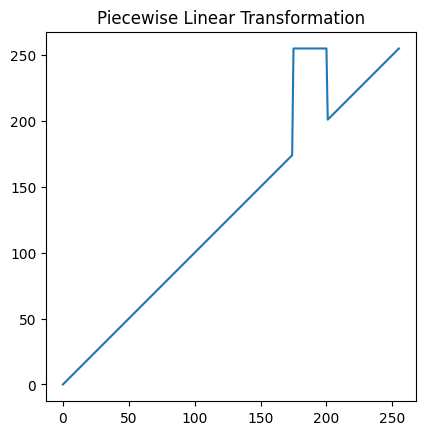

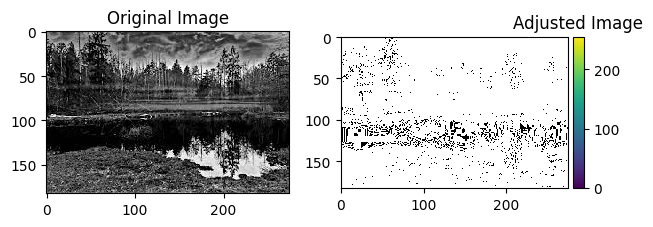

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imshow
from skimage.util import img_as_ubyte

# Load image from Git repository
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/swamp.jpg')

# Normalize image to range [0, 1]
Img = img_as_ubyte(Img)

#a. Contrast with identity transformation
x = np.arange(256, dtype=np.uint8)
plt.plot(x)
plt.xlim([0, 255])
plt.ylim([0, 255])
plt.title('Identity Transformation')
plt.show()

# Apply identity transformation to the image
Img_idt = x[Img]
plt.figure()
plt.subplot(1, 2, 1)
imshow(Img)
plt.title('Original Image')
plt.subplot(1, 2, 2)
imshow(Img_idt)
plt.title('Adjusted Image')
plt.show()

#b. Contrast with negative transformation
x_neg = 255 - x
plt.plot(x_neg)
plt.xlim([0, 255])
plt.ylim([0, 255])
plt.title('Negative Transformation')
plt.show()

# Apply negative transformation to the image
Img_cpm = 255 - Img
plt.figure()
plt.subplot(1, 2, 1)
imshow(Img)
plt.title('Original Image')
plt.subplot(1, 2, 2)
imshow(Img_cpm)
plt.title('Adjusted Image')
plt.show()

#c. Contrast with logarithm transformation
x = np.arange(256)
c = 255 / np.log(256)
y = c * np.log(x + 1)

plt.plot(y)
plt.xlim([0, 255])
plt.ylim([0, 255])
plt.title('Logarithm Transformation')
plt.show()

# Apply logarithm transformation to the image
Img_log = y[img_as_ubyte(Img * 255 / np.max(Img))] / 255
plt.figure()
plt.subplot(1, 2, 1)
imshow(Img)
plt.title('Original Image')
plt.subplot(1, 2, 2)
imshow(Img_log)
plt.title('Adjusted Image')
plt.show()

#d. Contrast with inverse logarithm transformation
x = np.arange(256)
c = 255 / np.log(4096)
y = np.exp(x / c) - 1

plt.plot(y)
plt.xlim([0, 255])
plt.ylim([0, 255])
plt.title('Inverse Logarithm Transformation')
plt.show()

# Apply inverse logarithm transformation to the image
Img_invlog = y[img_as_ubyte(Img * 255 / np.max(Img))] / 255
plt.figure()
plt.subplot(1, 2, 1)
imshow(Img)
plt.title('Original Image')
plt.subplot(1, 2, 2)
imshow(Img_invlog)
plt.title('Adjusted Image')
plt.show()

#e. Contrast with piecewise linear transformation
y = np.zeros(256)
y[:175] = np.arange(175)
y[175:201] = 255
y[201:256] = np.arange(201, 256)

# Apply piecewise linear transformation to the image
Img_pcslin = y[Img.astype(int)]
plt.plot(y)
plt.axis('tight')
plt.axis('square')
plt.title('Piecewise Linear Transformation')
plt.show()

plt.figure()
plt.subplot(1, 2, 1)
imshow(Img)
plt.title('Original Image')
plt.subplot(1, 2, 2)
imshow(Img_pcslin)
plt.title('Adjusted Image')
plt.show()

**Problem 5_1 Image Subtraction**

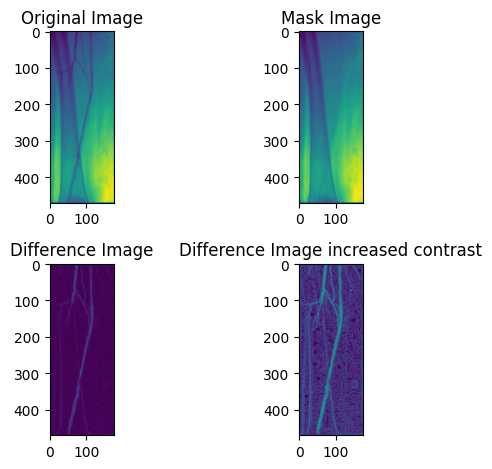

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imsave
from PIL import Image
import urllib.request

# URLs of the images in the GitHub repository
liveImg_url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/live.jpg'
maskImg_url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/mask.jpg'

# Download the images using urllib
urllib.request.urlretrieve(liveImg_url, 'live.jpg')
urllib.request.urlretrieve(maskImg_url, 'mask.jpg')

# Load images
liveImg = imread('live.jpg').astype(np.float64)
maskImg = imread('mask.jpg').astype(np.float64)

# Calculate the difference between two images
diffImg = np.abs(maskImg - liveImg)
gamma = 0.4
diffImg_constrated = diffImg ** gamma

# Show images
plt.subplot(2, 2, 1)
plt.imshow(liveImg)
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(maskImg)
plt.title('Mask Image')

plt.subplot(2, 2, 3)
plt.imshow(diffImg)
plt.title('Difference Image')

plt.subplot(2, 2, 4)
plt.imshow(diffImg_constrated)
plt.title('Difference Image increased contrast')

plt.tight_layout()
plt.show()

# Save images
imsave('Image_Subtraction.jpg', diffImg)
imsave('Image_Subtraction_w_con.jpg', diffImg_constrated)

**Problem 5_2 Image Comparison**

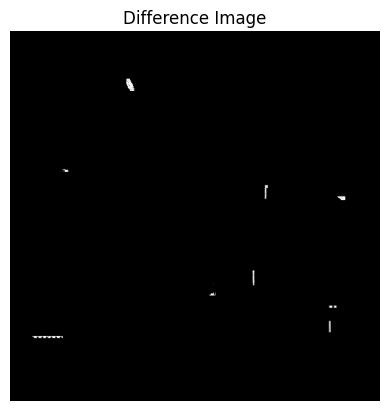

<ipython-input-10-1230f5837d3b>:26: UserWarning: Mask_Comparison.png is a low contrast image
  imsave('Mask_Comparison.png', diffImg)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imsave
import urllib.request

# URLs of the images in the GitHub repository
maskImg1_url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/mask1.png'
maskImg2_url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/mask2.png'

# Download the images using urllib
urllib.request.urlretrieve(maskImg1_url, 'mask1.png')
urllib.request.urlretrieve(maskImg2_url, 'mask2.png')

# Load images
maskImg1 = imread('mask1.png').astype(np.float64)
maskImg2 = imread('mask2.png').astype(np.float64)

# Perform image subtraction and comparison
diffImg = np.abs(maskImg2 - maskImg1)
plt.imshow(diffImg, cmap='gray')
plt.title('Difference Image')
plt.axis('off')
plt.show()

# Save the difference image
imsave('Mask_Comparison.png', diffImg)

**Problem 5_3 Image Averaging**

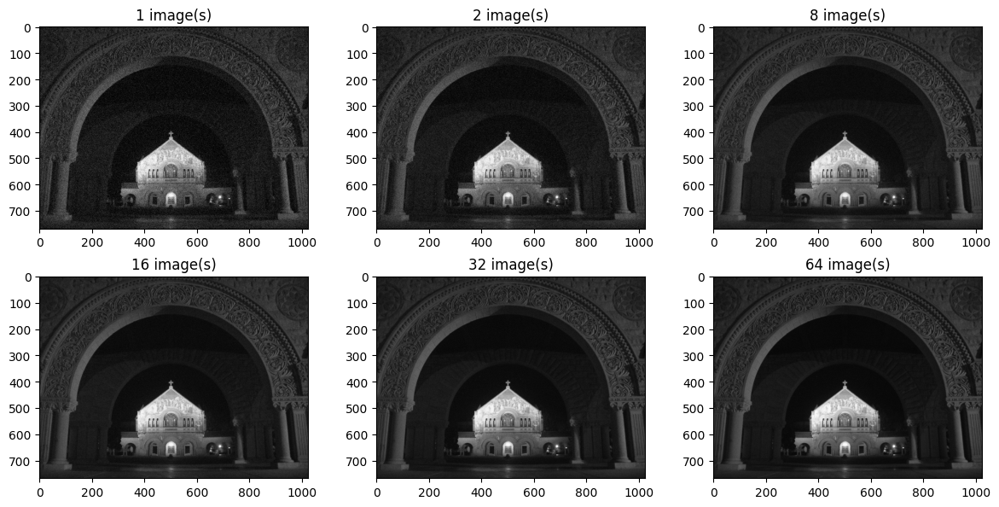

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.util import img_as_ubyte
from skimage.util import random_noise

# Load image
Img = img_as_ubyte(rgb2gray(imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/quadnight.jfif')))

# Repeat over different number of samples
nArray = [1, 2, 8, 16, 32, 64]
fig, axs = plt.subplots(2, len(nArray) // 2, figsize=(12, 6))
axs = axs.flatten()

for i, N in enumerate(nArray):
    avgImg = np.zeros_like(Img, dtype=np.float64)  # Initialize an empty image

    # Add Gaussian noise to each image, accumulate this image to avg image
    for _ in range(N):
        noisyImg = random_noise(Img, mode='gaussian', var=0.01)
        avgImg += noisyImg

    # Show image case i
    avgImg /= N
    axs[i].imshow(avgImg, cmap='gray')
    axs[i].set_title(f'{N} image(s)')

plt.tight_layout()
plt.show()

**Problem 5_4 Histogram Generation**

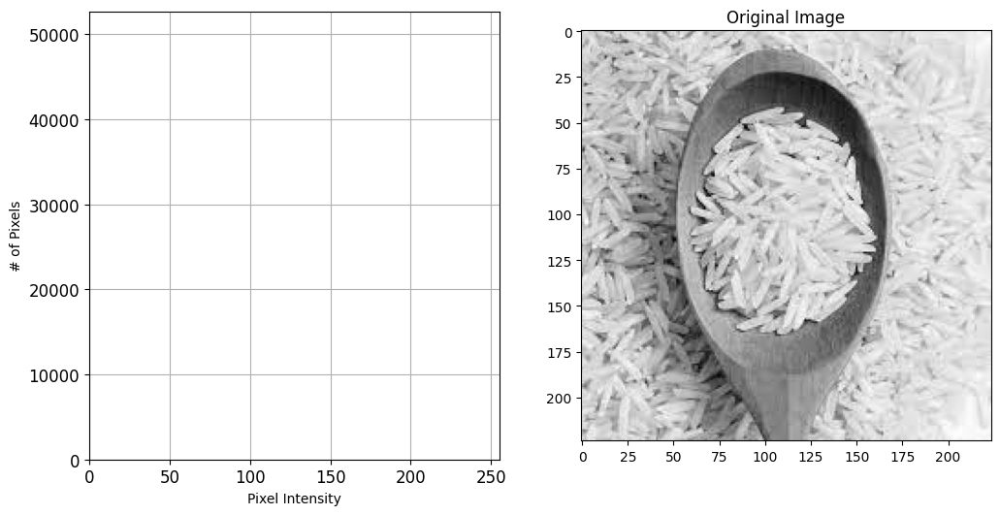

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import requests
from skimage.io import imread
from skimage.color import rgb2gray

# Load the image from Git repository
response = requests.get('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/rice.jfif')
Img = rgb2gray(imread(response.content, plugin='imageio'))

# Generate histogram
hist, bins = np.histogram(Img.flatten(), bins=256, range=[0, 256])

# Plot histogram
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.bar(bins[:-1], hist)
plt.grid(True)
plt.xlabel('Pixel Intensity')
plt.ylabel('# of Pixels')
plt.xlim([0, 255])
plt.tick_params(axis='both', labelsize=12)

# Display the original image
plt.subplot(1, 2, 2)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

# Save the figure with histogram
plt.savefig('Histogram.png')
plt.show()

**Problem 5_5 Global Histogram Equalization**

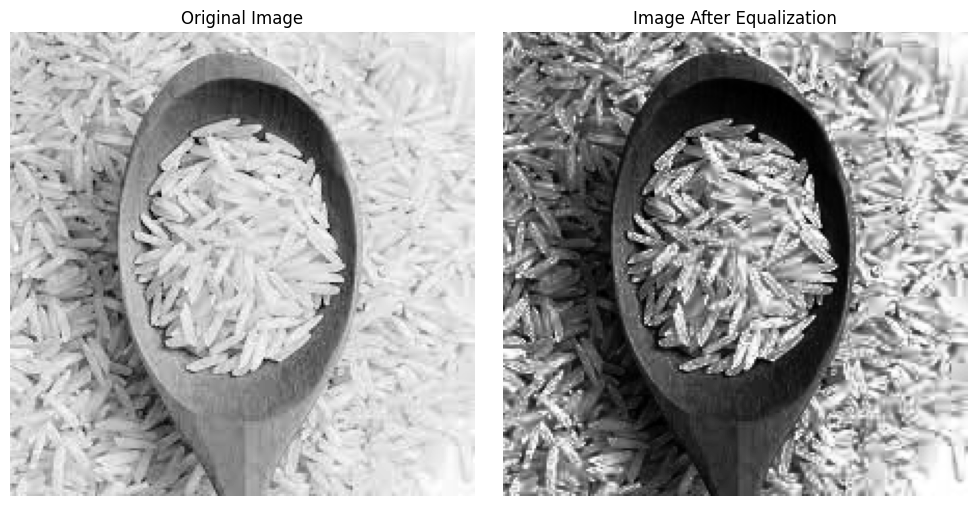

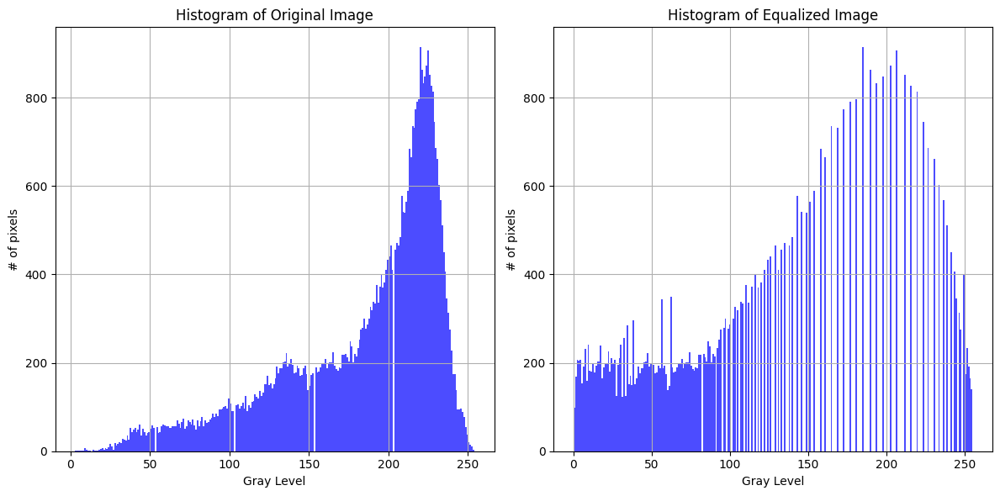

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import requests
from io import BytesIO

# Load image from Git path
response = requests.get('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/rice.jfif')
img = cv2.cvtColor(cv2.imdecode(np.frombuffer(response.content, np.uint8), cv2.IMREAD_COLOR), cv2.COLOR_BGR2GRAY)

# Perform histogram equalization
eq_img = cv2.equalizeHist(img)

# Show images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(eq_img, cmap='gray')
plt.title('Image After Equalization')
plt.axis('off')

plt.tight_layout()
plt.show()

# Show histograms of two images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(img.ravel(), bins=256, color='b', alpha=0.7)
plt.grid(True)
plt.xlabel('Gray Level')
plt.ylabel('# of pixels')
plt.title('Histogram of Original Image')

plt.subplot(1, 2, 2)
plt.hist(eq_img.ravel(), bins=256, color='b', alpha=0.7)
plt.grid(True)
plt.xlabel('Gray Level')
plt.ylabel('# of pixels')
plt.title('Histogram of Equalized Image')

plt.tight_layout()
plt.show()

**Problem 5_6 Local Histogram Equalization**

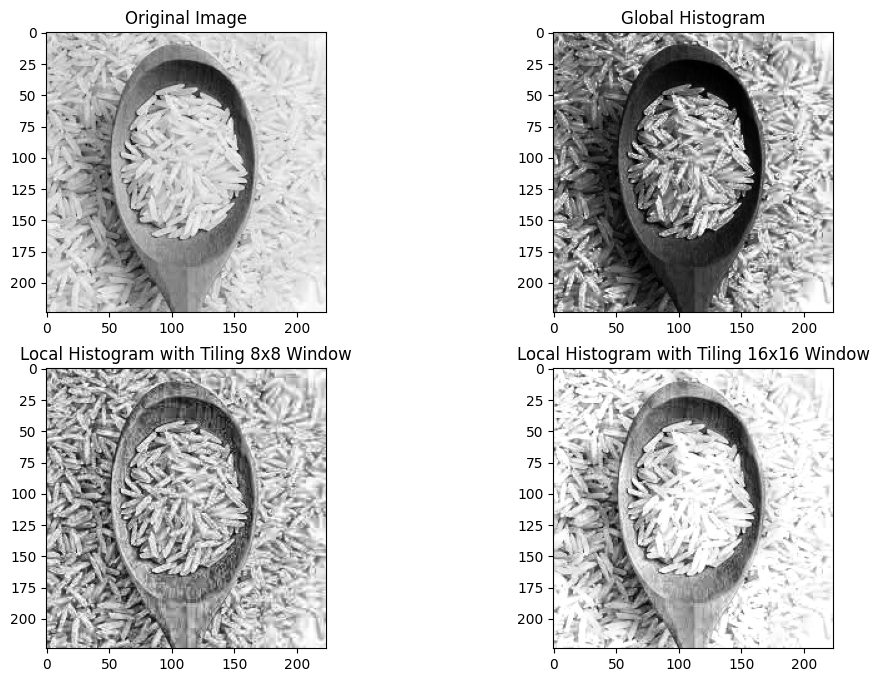

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import exposure

# Load the image from Git repository
Img = rgb2gray(imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/rice.jfif'))

# Apply global and local adaptive histogram equalization
# a. Global
eqImg = exposure.equalize_hist(Img)
# b. and c. Contrast Limited Adaptive Histogram Equalization (CLAHE) in two cases: sliding window 8x8 and 16x16
claheImg1 = exposure.equalize_adapthist(Img, kernel_size=(8, 8))
claheImg2 = exposure.equalize_adapthist(Img, kernel_size=(16, 16))

# Show images
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(eqImg, cmap='gray')
plt.title('Global Histogram')

plt.subplot(2, 2, 3)
plt.imshow(claheImg1, cmap='gray')
plt.title('Local Histogram with Tiling 8x8 Window')

plt.subplot(2, 2, 4)
plt.imshow(claheImg2, cmap='gray')
plt.title('Local Histogram with Tiling 16x16 Window')

# Save images
plt.imsave('CLAHE_Global.png', eqImg, cmap='gray')
plt.imsave('CLAHE_Local_8by8.png', claheImg1, cmap='gray')
plt.imsave('CLAHE_Local_16by16.png', claheImg2, cmap='gray')

plt.show()

Thank you for watching !

# Home Work 2

Problem 7_1 Convolution between a kernel and an image

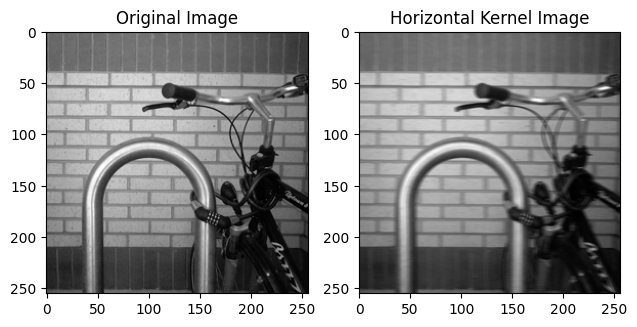

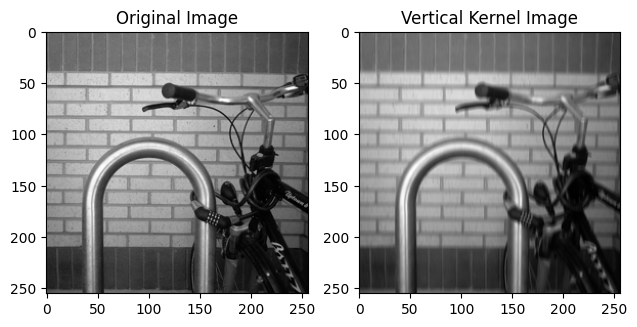

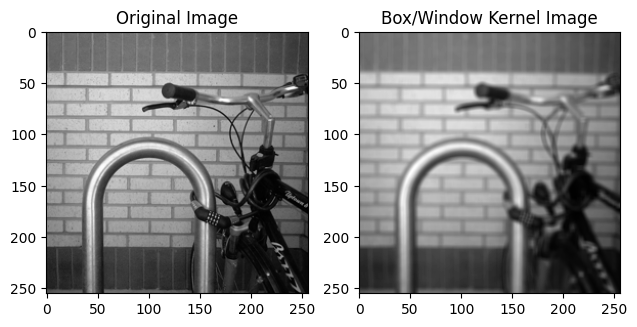

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread

# Load image
url = "https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/bike.png"
Img = imread(url)

# Construct three different kernels (impulse responses)
k1 = np.ones((1, 5)) / 5  # horizontal kernel
k2 = np.ones((5, 1)) / 5  # vertical kernel
k3 = np.ones((5, 5)) / 25  # box/window kernel

# Perform convolution on the image
filteredImg1 = cv2.filter2D(Img, -1, k1, borderType=cv2.BORDER_REFLECT)
filteredImg2 = cv2.filter2D(Img, -1, k2, borderType=cv2.BORDER_REFLECT)
filteredImg3 = cv2.filter2D(Img, -1, k3, borderType=cv2.BORDER_REFLECT)

# Show images
fig, axs = plt.subplots(1, 2)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(filteredImg1, cmap='gray')
axs[1].set_title('Horizontal Kernel Image')
plt.tight_layout()
plt.show()

fig, axs = plt.subplots(1, 2)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(filteredImg2, cmap='gray')
axs[1].set_title('Vertical Kernel Image')
plt.tight_layout()
plt.show()

fig, axs = plt.subplots(1, 2)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(filteredImg3, cmap='gray')
axs[1].set_title('Box/Window Kernel Image')
plt.tight_layout()
plt.show()

# Save images
cv2.imwrite('Horizontal_Convolution.png', filteredImg1 * 255)
cv2.imwrite('Vertical_Convolution.png', filteredImg2 * 255)
cv2.imwrite('Box_Convolution.png', filteredImg3 * 255)

Problem 7_2 Sharpening filter an image

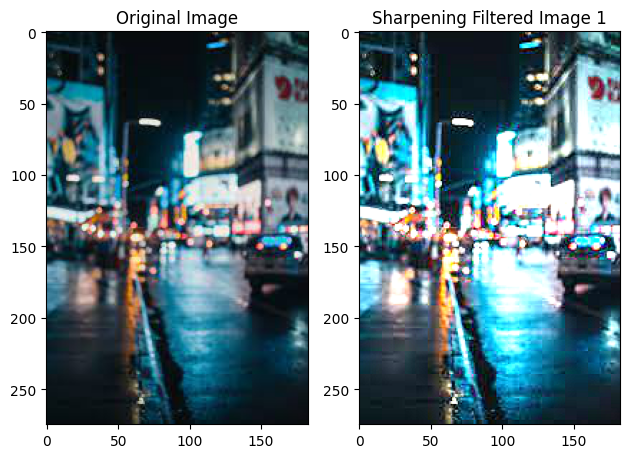

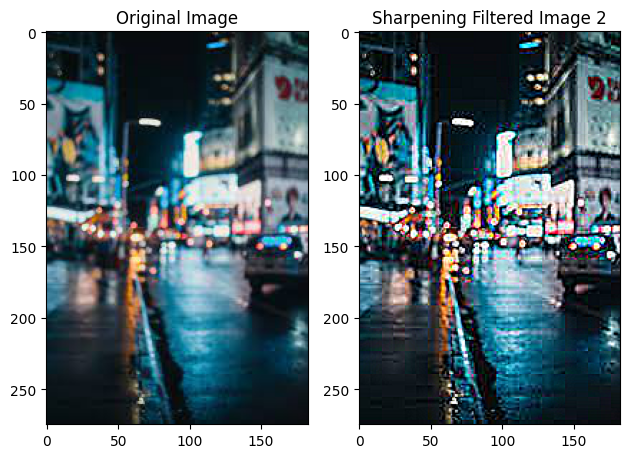

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread

# Load image
url = "https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/street.jfif"
Img = imread(url)

# Apply a sharpening filter to the image
h1 = np.array([[0, -1, 0], [-1, 9, -1], [0, -1, 0]]) / 3  # 3-by-3 box filter
h2 = np.array([[0, 0, -1, 0, 0],
               [0, -1, -1, -1, 0],
               [-1, -1, 16, -1, -1],
               [0, -1, -1, -1, 0],
               [0, 0, -1, 0, 0]]) / 4  # 5-by-5 box filter

filteredImg1 = cv2.filter2D(Img, -1, h1, borderType=cv2.BORDER_REPLICATE)
filteredImg2 = cv2.filter2D(Img, -1, h2, borderType=cv2.BORDER_REPLICATE)

# Show images
fig, axs = plt.subplots(1, 2)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(filteredImg1, cmap='gray')
axs[1].set_title('Sharpening Filtered Image 1')
plt.tight_layout()
plt.show()

fig, axs = plt.subplots(1, 2)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(filteredImg2, cmap='gray')
axs[1].set_title('Sharpening Filtered Image 2')
plt.tight_layout()
plt.show()

# Save images
cv2.imwrite('Sharpening_Filter1.png', filteredImg1 * 255)
cv2.imwrite('Sharpening_Filter2.png', filteredImg2 * 255)

Problem 7_3 Wiener Filtering with Additive Noise

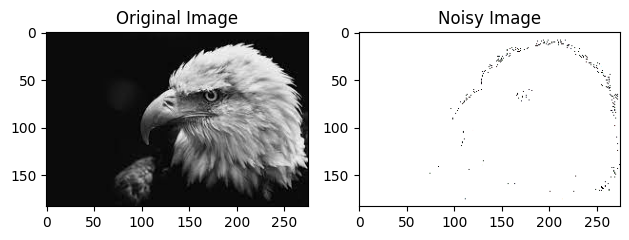

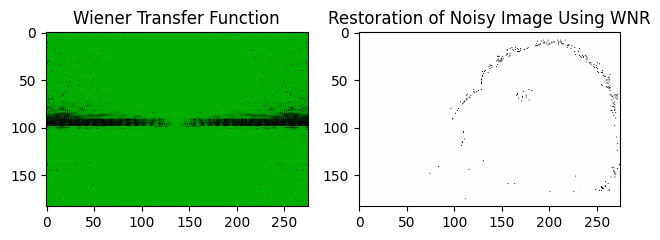

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.util import img_as_ubyte
from scipy.fft import fft2, ifft2

# Load image
url = "https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/eagle.jfif"
Img = imread(url)

# Show original image
fig, axs = plt.subplots(1, 2)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')

# Simulate additive Gaussian noise
noise_mean = 0
noise_var = 0.005
noisyImg = np.clip(Img + np.random.normal(noise_mean, np.sqrt(noise_var), Img.shape), 0, 1)
axs[1].imshow(noisyImg, cmap='gray')
axs[1].set_title('Noisy Image')
plt.tight_layout()
plt.show()

# Save noisy image
cv2.imwrite('Additive_Gaussian_Noise.png', img_as_ubyte(noisyImg))

# Perform Wiener Filtering on the noisy image
dif = 255 * (noisyImg - Img)
rms_err_before_wnr = np.sqrt(np.mean(dif ** 2))

noisy_dft = fft2(noisyImg)  # DFT of noisy image
Img_psd = np.abs(fft2(Img)) ** 2  # original image Power Spectral Density (PSD)
noise_psd = np.prod(Img_psd.shape) * noise_var  # white noise PSD
wnr_H = Img_psd / (Img_psd + noise_psd)  # Wiener transfer function

fig, axs = plt.subplots(1, 2)
axs[0].imshow(np.fft.fftshift(np.log(1 + wnr_H)), cmap='jet', vmin=0, vmax=np.log(2 + np.max(wnr_H)))
axs[0].set_title('Wiener Transfer Function')
# axs[0].colorbar()
wnr_dft = noisy_dft * wnr_H  # DFT of filtered image
wnr = np.real(ifft2(wnr_dft))  # convert back to spatial domain
axs[1].imshow(wnr, cmap='gray')
axs[1].set_title('Restoration of Noisy Image Using WNR')
plt.tight_layout()
plt.show()

# Save filtered image
# cv2.imwrite('Wiener_Filtered_Additive_Noise.png', img_as_ubyte(wnr))

dif = 255 * (wnr - Img)
rms_err_after_wnr = np.sqrt(np.mean(dif ** 2))

Problem 7_4 Wiener Filtering with Blurred and Additive Noise

RMS Error after Wiener filtering: 39.68639244296924


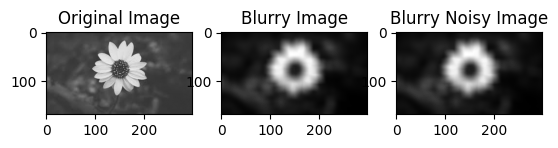

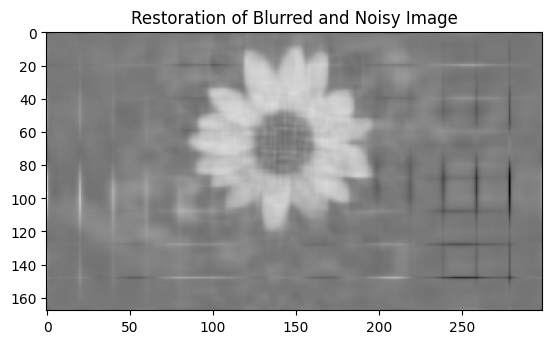

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.util import img_as_ubyte
from scipy.signal import convolve2d
from scipy.fft import fft2, ifft2
from scipy.ndimage import gaussian_filter

# Load image
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/flower.jfif')
Img = Img.astype(np.float64) / 255.0

# Show original image
plt.figure(1)
plt.subplot(1, 3, 1)
plt.imshow(Img)
plt.title('Original Image')

# Simulate a blur motion
LEN = 20
THETA = 10
PSF = gaussian_filter(np.eye(LEN), sigma=THETA)
Img_2d = np.mean(Img, axis=2)  # Convert to 2-D grayscale

# Perform convolution
blurredImg = convolve2d(Img_2d, PSF, mode='same', boundary='symm')

# Show blurry image
plt.subplot(1, 3, 2)
plt.imshow(blurredImg, cmap='gray')
plt.title('Blurry Image')

# Simulate additive noise
noise_mean = 0
noise_var = 0.01
blurred_noisyImg = blurredImg + np.random.normal(noise_mean, noise_var, size=blurredImg.shape)

# Show blurry noisy image
plt.subplot(1, 3, 3)
plt.imshow(blurred_noisyImg, cmap='gray')
plt.title('Blurry Noisy Image')

# Perform Wiener filtering
estimated_nr = noise_var / np.var(Img_2d)
PSF_pad = np.pad(PSF, ((0, blurred_noisyImg.shape[0] - PSF.shape[0]), (0, blurred_noisyImg.shape[1] - PSF.shape[1])))
PSF_fft = fft2(PSF_pad)
blurred_noisyImg_fft = fft2(blurred_noisyImg)
wnr_fft = np.conj(PSF_fft) / (np.abs(PSF_fft) ** 2 + estimated_nr)
wnr = np.real(ifft2(blurred_noisyImg_fft * wnr_fft))

# Show restored image
plt.figure(2)
plt.imshow(wnr, cmap='gray')
plt.title('Restoration of Blurred and Noisy Image')

# Save restored image
# imwrite('Wiener_Filtered_Blurry_Additive_Noise.png', img_as_ubyte(wnr))

# Calculate RMS error
dif = 255 * (wnr - Img_2d)
rms_err_after_wnr = np.sqrt(np.mean(dif**2))
print('RMS Error after Wiener filtering:', rms_err_after_wnr)

plt.show()

Problem 7_5 Binary Dilation

<ipython-input-50-feb9369e9320>:12: FutureWarning: `selem` is a deprecated argument name for `dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  BW1 = dilation(Img, selem=se1)
<ipython-input-50-feb9369e9320>:15: FutureWarning: `selem` is a deprecated argument name for `dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  BW2 = dilation(Img, selem=se2)


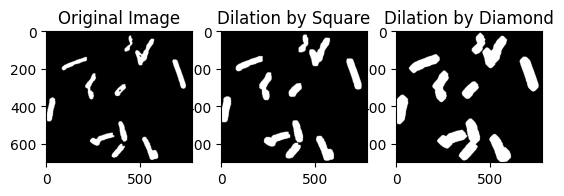

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imsave
from skimage.morphology import dilation, square, diamond

# Load image from Git path
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/traces.png')

# Perform dilation with different structuring elements (se)
# a. square with side = 15
se1 = square(10)
BW1 = dilation(Img, selem=se1)
# b. diamond with side = 15
se2 = diamond(15)
BW2 = dilation(Img, selem=se2)

# Show and save images
plt.figure(1)
plt.subplot(1, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(BW1, cmap='gray')
plt.title('Dilation by Square')

plt.subplot(1, 3, 3)
plt.imshow(BW2, cmap='gray')
plt.title('Dilation by Diamond')

imsave('Dilation_Square.png', BW1)
imsave('Dilation_Diamond.png', BW2)

plt.show()

Problem 7_6 Binary Erosion

<ipython-input-51-e3e8967cf797>:12: FutureWarning: `selem` is a deprecated argument name for `erosion`. It will be removed in version 1.0. Please use `footprint` instead.
  BW1 = erosion(Img, selem=se1)
<ipython-input-51-e3e8967cf797>:15: FutureWarning: `selem` is a deprecated argument name for `erosion`. It will be removed in version 1.0. Please use `footprint` instead.
  BW2 = erosion(Img, selem=se2)
<ipython-input-51-e3e8967cf797>:32: UserWarning: Erosion_Disk_30.png is a low contrast image
  imsave('Erosion_Disk_30.png', BW2)


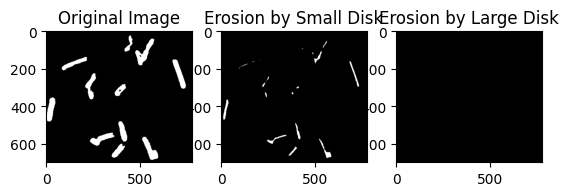

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imsave
from skimage.morphology import erosion, disk

# Load image
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/traces.png')

# Perform erosion with different structuring elements (se)
# a. small disk with radius = 10
se1 = disk(10)
BW1 = erosion(Img, selem=se1)
# b. large disk with radius = 30
se2 = disk(30)
BW2 = erosion(Img, selem=se2)

# Show and save images
plt.figure(1)
plt.subplot(1, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(BW1, cmap='gray')
plt.title('Erosion by Small Disk')

plt.subplot(1, 3, 3)
plt.imshow(BW2, cmap='gray')
plt.title('Erosion by Large Disk')

imsave('Erosion_Disk_10.png', BW1)
imsave('Erosion_Disk_30.png', BW2)

plt.show()

Problem 8_1 Binary Erosion with Coins

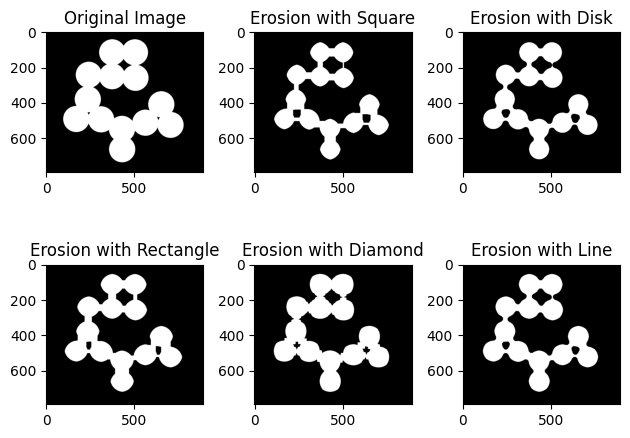

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import exposure

# Load image
import urllib.request

# URL of the image
# Load the image from Git repository
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/circles.png')

# Perform erosion with different structuring elements
# a. square with side = 30
se1 = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 30))
BW1 = cv2.erode(Img, se1)

# b. disk with radius = 35
se2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (35, 35))
BW2 = cv2.erode(Img, se2)

# c. rectangle with dimensions = [15 30]
se3 = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 30))
BW3 = cv2.erode(Img, se3)

# d. diamond with radius = 30
se4 = cv2.getStructuringElement(cv2.MORPH_CROSS, (30, 30))
BW4 = cv2.erode(Img, se4)

# e. line with length = 30 and inclined degree = 45
se5 = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 30))
se5 = cv2.warpAffine(se5, cv2.getRotationMatrix2D((15, 15), 45, 1), (30, 30))
BW5 = cv2.erode(Img, se5)

# Show and save images
fig, axs = plt.subplots(2, 3)
axs[0, 0].imshow(Img, cmap='gray')
axs[0, 0].set_title('Original Image')
axs[0, 1].imshow(BW1, cmap='gray')
axs[0, 1].set_title('Erosion with Square')
axs[0, 2].imshow(BW2, cmap='gray')
axs[0, 2].set_title('Erosion with Disk')
axs[1, 0].imshow(BW3, cmap='gray')
axs[1, 0].set_title('Erosion with Rectangle')
axs[1, 1].imshow(BW4, cmap='gray')
axs[1, 1].set_title('Erosion with Diamond')
axs[1, 2].imshow(BW5, cmap='gray')
axs[1, 2].set_title('Erosion with Line')
plt.tight_layout()

cv2.imwrite('Binary_Erosion_Coins_Square.png', BW1)
cv2.imwrite('Binary_Erosion_Coins_Disk.png', BW2)
cv2.imwrite('Binary_Erosion_Coins_Rectangle.png', BW3)
cv2.imwrite('Binary_Erosion_Coins_Diamond.png', BW4)
cv2.imwrite('Binary_Erosion_Coins_Line.png', BW5)

plt.show()

Problem 8_2 Hole Detection in a Fence using Erosion

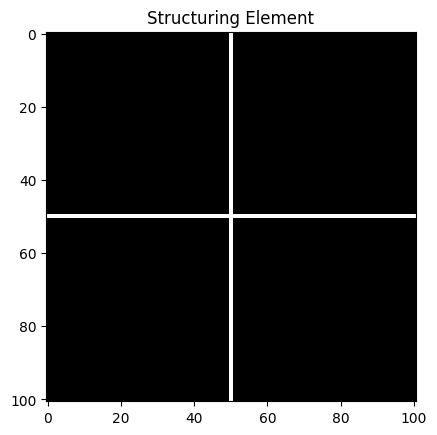

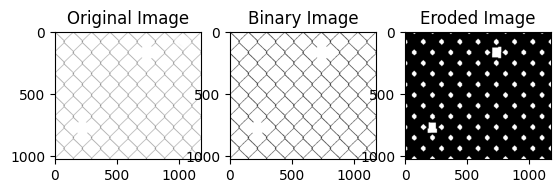

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.morphology import binary_erosion

# Load the image from Git repository
Img = rgb2gray(imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/fence.jpg'))
ImgSize = Img.shape
level = threshold_otsu(Img)
BW = Img > level

# Perform erosion with a cross structuring element
length = 101
NHOOD = np.zeros((length, length))
NHOOD[length // 2, :] = 1
NHOOD[:, length // 2] = 1
se = NHOOD.astype(bool)

# Show the structuring element
plt.figure(1)
plt.imshow(NHOOD, cmap='gray')
plt.title('Structuring Element')

BW1 = binary_erosion(BW, se)

# Display the results
plt.figure(2)
plt.subplot(1, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 3, 2)
plt.imshow(BW, cmap='gray')
plt.title('Binary Image')
plt.subplot(1, 3, 3)
plt.imshow(BW1, cmap='gray')
plt.title('Eroded Image')

# Save the images
cv2.imwrite('Binary_Erosion_Fence_BW.jpg', (BW * 255).astype(np.uint8))
cv2.imwrite('Binary_Erosion_Fence_Hole_Detection.jpg', (BW1 * 255).astype(np.uint8))

plt.show()

Problem 8_3 Edge Detection with Dilation and Erosion

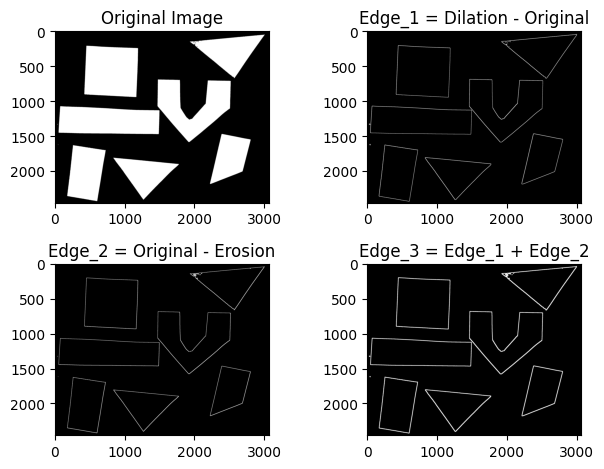

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.morphology import dilation, erosion, square

# Load image
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/objects.png').astype(float)

# Detect edges
se = square(10)  # Apply any structuring element
Img_dilation = dilation(Img, se)
Img_erosion = erosion(Img, se)
edge_1 = Img_dilation - Img
edge_2 = Img - Img_erosion
edge_3 = edge_1 + edge_2

# Show images
plt.subplot(2, 2, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(edge_1, cmap='gray')
plt.title('Edge_1 = Dilation - Original')

plt.subplot(2, 2, 3)
plt.imshow(edge_2, cmap='gray')
plt.title('Edge_2 = Original - Erosion')

plt.subplot(2, 2, 4)
plt.imshow(edge_3, cmap='gray')
plt.title('Edge_3 = Edge_1 + Edge_2')

plt.tight_layout()
plt.show()

# Save images
cv2.imwrite('Edge_Detection_by_Dilation.jpg', edge_1)
cv2.imwrite('Edge_Detection_by_Erosion.jpg', edge_2)
cv2.imwrite('Edge_Detection_by_Combination.jpg', edge_3)


Problem 8_4 Graylevel Dilation and Erosion

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import grey_dilation, grey_erosion
from skimage.io import imread

# Load image
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/portrait.jpg')

# Choose any column of the image as 1-d sample array
originalColumn = Img[:, 1800, 0]  # Extract the red channel

# Loop over different structuring elements (i.e., line)
for length in range(1, 22, 3):
    se = np.ones(length)
    dilated_Col = grey_dilation(originalColumn, structure=se)
    eroded_Col = grey_erosion(originalColumn, structure=se)

    plt.figure()
    plt.plot(originalColumn, 'b--')
    plt.plot(dilated_Col, 'r', linewidth=1)
    plt.plot(eroded_Col, 'g', linewidth=1)

    plt.title(f'Structuring Element Length = {length}')
    plt.savefig(f'1D_Dilation_Erosion_{length}.png')

    plt.close()

Problem 8_5 Coin Counting

Number of coins: 20


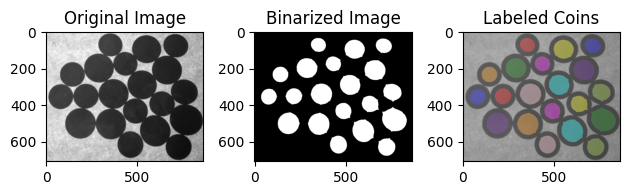

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.morphology import disk
from skimage.filters import threshold_otsu
from skimage.measure import label
from skimage.color import label2rgb

# Load image
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/coins.png')

# Counting on processed image
fig, axs = plt.subplots(1, 3)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')

# Binarize the original image
se = disk(25)
dilatedImg = cv2.dilate(Img, se)
level = threshold_otsu(dilatedImg)
bwImg2 = 1 - (dilatedImg >= level)
axs[1].imshow(bwImg2, cmap='gray')
axs[1].set_title('Binarized Image')

# Object counting
L, obj = label(bwImg2, connectivity=2, return_num=True)
rgbLabel2 = label2rgb(L, image=Img, bg_label=0)
print('Number of coins:', obj)
axs[2].imshow(rgbLabel2)
axs[2].set_title('Labeled Coins')

plt.tight_layout()
plt.show()

Problem_10_1 Manual Gray Level Threshold

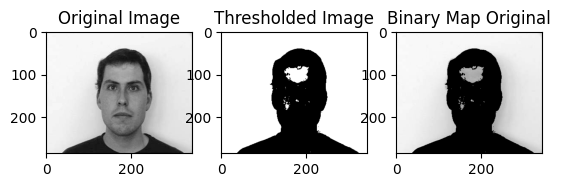

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread

# Load image
img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/male.png')

# Define threshold value
level = 108

# Apply thresholding
_, bw_img = cv2.threshold(img, level, 255, cv2.THRESH_BINARY)
blended_img = cv2.bitwise_and(img, img, mask=bw_img)

# Display images
plt.subplot(1, 3, 1), plt.imshow(img, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 3, 2), plt.imshow(bw_img, cmap='gray'), plt.title('Thresholded Image')
plt.subplot(1, 3, 3), plt.imshow(blended_img, cmap='gray'), plt.title('Binary Map Original')

# Save images
cv2.imwrite('Gray_Level_Thresholding.png', bw_img)
cv2.imwrite('Gray_Level_Blended.png', blended_img)

plt.show()

Problem_10_2 Global Gray Leevl Threshold

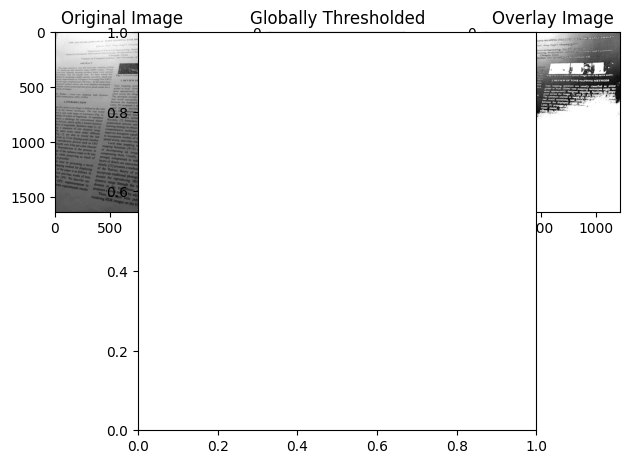

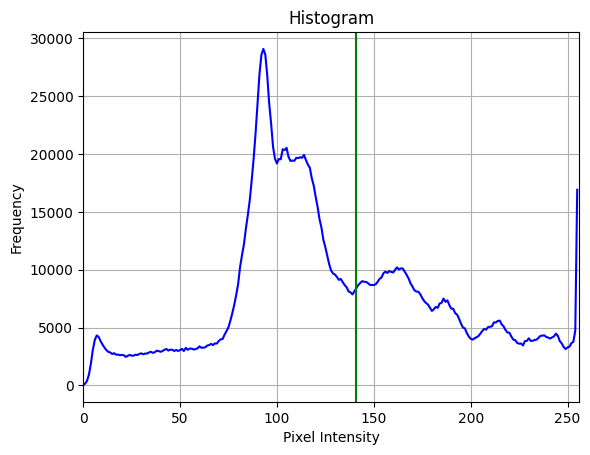

In [ ]:
import cv2
import numpy as np
import urllib.request
import matplotlib.pyplot as plt

# Load the image from URL
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/paper.png'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)

# Global thresholding by Otsu method
_, bw_img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
blended_img = np.where(bw_img == 0, img, 255)

# Display images
plt.subplot(2, 3, 1), plt.imshow(img, cmap='gray'), plt.title('Original Image')
plt.subplot(2, 3, 2), plt.imshow(bw_img, cmap='gray'), plt.title('Globally Thresholded')
plt.subplot(2, 3, 3), plt.imshow(blended_img, cmap='gray'), plt.title('Overlay Image')
plt.axes().set_aspect('equal')
plt.tight_layout()

# Show histogram of image and threshold value
hist = cv2.calcHist([img], [0], None, [256], [0, 256])
otsu_thresh, _ = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
plt.figure()
plt.plot(hist, color='b')
plt.axvline(x=otsu_thresh, color='g')
plt.xlim([0, 256])
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.title('Histogram')
plt.grid(True)

# Save images
cv2.imwrite('Global_Threshold_Image.png', bw_img)
plt.savefig('Global_Threshold_Histogram.png')

plt.show()

Problem_10_3 Global Threshold

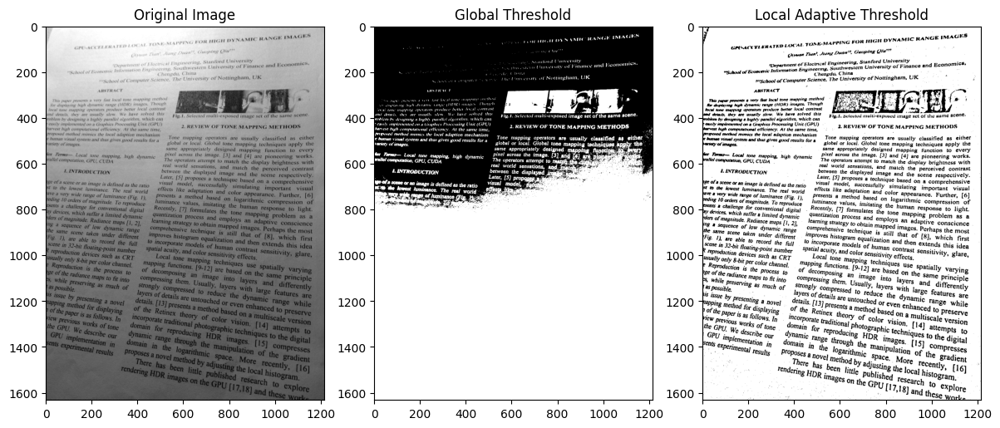

In [ ]:
import cv2
import numpy as np
import urllib.request
import matplotlib.pyplot as plt

# Load the image from URL
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/paper.png'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)

# Global thresholding by Otsu method
_, global_bw_img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Local adaptive thresholding
adaptive_thresh_img = cv2.adaptiveThreshold(
    img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 31, 10
)

# Display images
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(global_bw_img, cmap='gray')
plt.title('Global Threshold')

plt.subplot(1, 3, 3)
plt.imshow(adaptive_thresh_img, cmap='gray')
plt.title('Local Adaptive Threshold')

plt.tight_layout()
plt.show()

Problem_11_1 Pseudocolor Image Processing

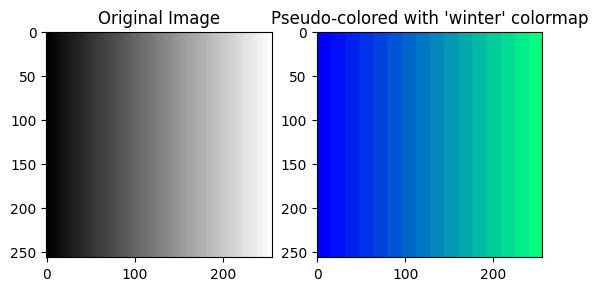

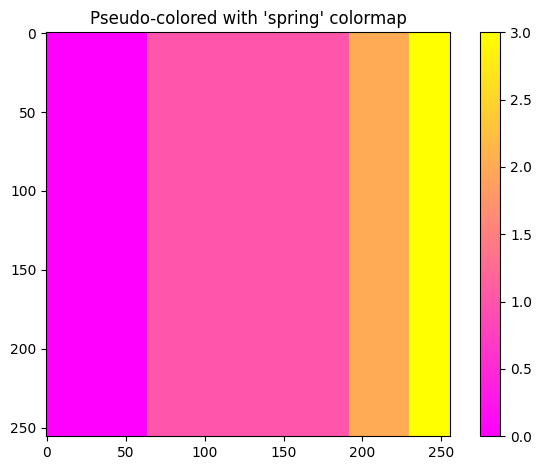

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Create and display a gradient image
I = np.tile(np.arange(256, dtype=np.uint8), (256, 1))
plt.subplot(1, 2, 1)
plt.imshow(I, cmap='gray')
plt.title('Original Image')

# Slice the image and display the results
I2 = np.floor(I / 16).astype(np.uint8)
plt.subplot(1, 2, 2)
plt.imshow(I2, cmap='winter')
plt.title("Pseudo-colored with 'winter' colormap")

# Slice the image into unequal partitions and display the results
levels = [0.25 * 255, 0.75 * 255, 0.9 * 255]
I3 = np.digitize(I, levels)
plt.figure()
plt.imshow(I3, cmap='spring')
plt.colorbar()
plt.title("Pseudo-colored with 'spring' colormap")

plt.tight_layout()
plt.show()

Problem_11_2 Pseudo-colored to grayscale image

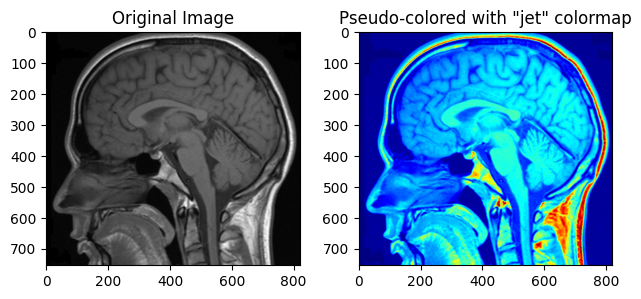

In [ ]:
import urllib.request
import cv2
import matplotlib.pyplot as plt

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/brain.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Convert image to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Pseudo-color the grayscale image
pseudo_img = cv2.applyColorMap(gray_img, cv2.COLORMAP_JET)

# Display the original and pseudo-colored images
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(pseudo_img, cv2.COLOR_BGR2RGB))
plt.title('Pseudo-colored with "jet" colormap')

plt.tight_layout()
plt.show()

Problem_11_3full-color image processing

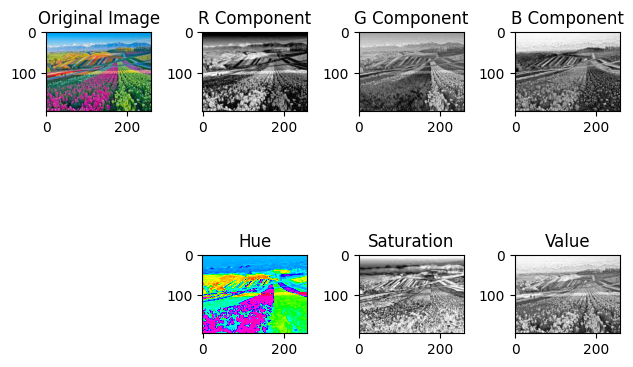

In [ ]:
import urllib.request
import cv2
import matplotlib.pyplot as plt

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/flowerfield.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Display the original image and its components
plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(2, 4, 2)
plt.imshow(img[:, :, 2], cmap='gray')
plt.title('R Component')

plt.subplot(2, 4, 3)
plt.imshow(img[:, :, 1], cmap='gray')
plt.title('G Component')

plt.subplot(2, 4, 4)
plt.imshow(img[:, :, 0], cmap='gray')
plt.title('B Component')

# Convert from BGR to HSV color model
imghsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Display the HSV components
plt.subplot(2, 4, 6)
plt.imshow(imghsv[:, :, 0], cmap='hsv')
plt.title('Hue')

plt.subplot(2, 4, 7)
plt.imshow(imghsv[:, :, 1], cmap='gray')
plt.title('Saturation')

plt.subplot(2, 4, 8)
plt.imshow(imghsv[:, :, 2], cmap='gray')
plt.title('Value')

plt.tight_layout()
plt.show()

Problem 11_4 compare grayscale image and value image in hsv

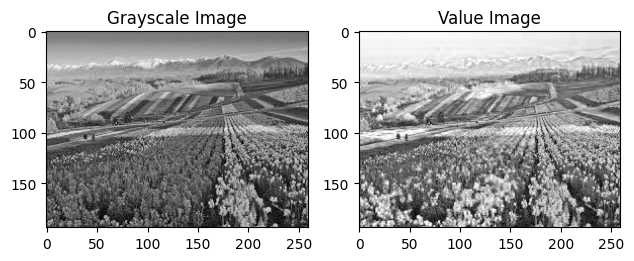

In [ ]:
import urllib.request
import cv2
import matplotlib.pyplot as plt

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/flowerfield.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Convert the image to grayscale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Convert the image to HSV
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Display the grayscale image and value image in HSV
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(1, 2, 2)
plt.imshow(img_hsv[:, :, 2], cmap='gray')
plt.title('Value Image')

plt.tight_layout()
plt.show()

Problem 11_5 smooth each component of color image by a filter

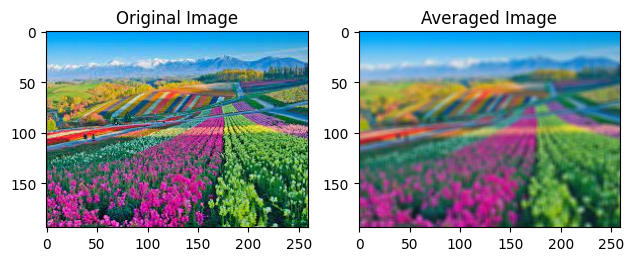

In [ ]:
import urllib.request
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/flowerfield.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Define a filter
filter_size = 5
filter_kernel = np.ones((filter_size, filter_size), np.float32) / (filter_size * filter_size)

# Split the image into color channels
b, g, r = cv2.split(img)

# Apply the filter to each channel
b_filtered = cv2.filter2D(b, -1, filter_kernel)
g_filtered = cv2.filter2D(g, -1, filter_kernel)
r_filtered = cv2.filter2D(r, -1, filter_kernel)

# Merge the filtered channels back into an image
img_filtered = cv2.merge((b_filtered, g_filtered, r_filtered))

# Plot and display the original and filtered images
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_filtered, cv2.COLOR_BGR2RGB))
plt.title('Averaged Image')

plt.tight_layout()
plt.show()

Problem 11_6 Determinant of Hessian (DoH) Detector

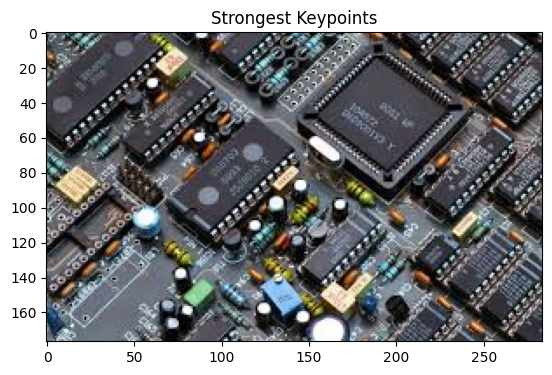

In [ ]:
import urllib.request
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/circuit.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Convert the image to grayscale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Create filters
sigma = 2
g = cv2.getGaussianKernel(int(10 * sigma + 1), sigma)
sobel = cv2.getDerivKernels(1, 1, 3, normalize=False)

filterXG = cv2.filter2D(cv2.filter2D(g, -1, sobel[0]), -1, sobel[1].T, borderType=cv2.BORDER_REPLICATE)
filterYG = cv2.filter2D(cv2.filter2D(g, -1, sobel[1]), -1, sobel[0].T, borderType=cv2.BORDER_REPLICATE)
filterXYG = cv2.filter2D(cv2.filter2D(g, -1, sobel[0]), -1, sobel[1], borderType=cv2.BORDER_REPLICATE)

# Calculate Determinant of Hessian (DoH)
img_Dxx = cv2.filter2D(img_gray, -1, filterXG, borderType=cv2.BORDER_REPLICATE)
img_Dyy = cv2.filter2D(img_gray, -1, filterYG, borderType=cv2.BORDER_REPLICATE)
img_Dxy = cv2.filter2D(img_gray, -1, filterXYG, borderType=cv2.BORDER_REPLICATE)
img_filt = img_Dxx * img_Dyy - img_Dxy ** 2

# Find extrema (local maxima)
threshold = 0.5 * np.max(img_filt)
img_filt[img_filt < threshold] = 0
img_ext = cv2.dilate(cv2.compare(img_filt, cv2.dilate(img_filt, np.ones((3, 3))), cv2.CMP_EQ), np.ones((3, 3)))

# Show N strongest keypoints
num_corners = np.sum(img_ext)
responses = img_filt[img_ext == 1]
sort_indices = np.argsort(responses)[::-1]
n = min(20, len(sort_indices))  # N = 20 or total number of keypoints
fig, ax = plt.subplots()
ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
for i in range(n):
    idx = sort_indices[i]
    row, col = np.where(img_ext == 1)
    h = ax.plot(col[idx], row[idx], 'y+')
    plt.setp(h, 'markersize', 15, 'markerfacecolor', 'y')
plt.title("Strongest Keypoints")

plt.show()

# Final Exam

1. (15 điểm) – Ảnh màu (Color Image) và Cân bằng ảnh màu (Color Image Equalization)
Cho ảnh màu JPG tên Ex1.jpg </br>
(a) Hiển thị ảnh gốc và biểu đồ tần số (histogram) của ảnh gốc. </br>
(b) Áp dụng cân bằng biểu đồ tần số (histogram equalization) cho ảnh gốc. Hiển thị ảnh sau khi được
cân bằng và biểu đồ tần số của nó. </br>
(c) Hiển thị ba thành phần R, G, B của ảnh gốc, áp dụng cân bằng biểu đồ tần số cho từng thành phần.

*   List item
*   List item


Sau đó, ghép ba thành phần lại thành một ảnh màu mới. So sánh ảnh này với ảnh ở câu b.

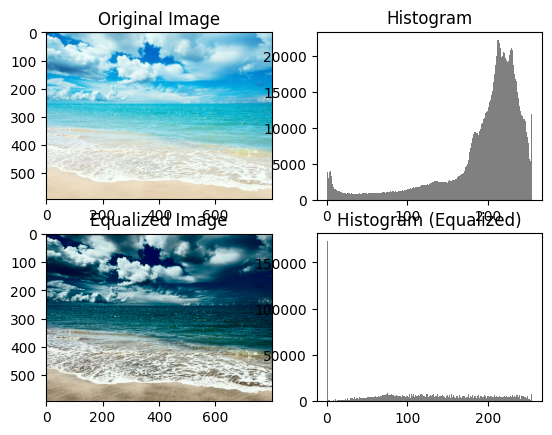

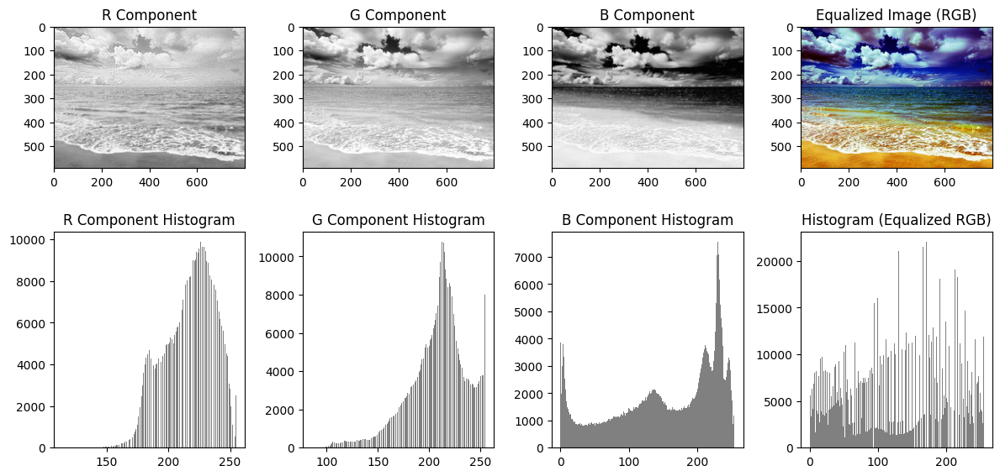

In [1]:
import urllib.request
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/Ex1.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Display the original image and its histogram
plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.hist(img.ravel(), bins=256, color='gray')
plt.title('Histogram')

# Apply histogram equalization to the original image
img_equalized = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
img_equalized[:, :, 0] = cv2.equalizeHist(img_equalized[:, :, 0])
img_equalized = cv2.cvtColor(img_equalized, cv2.COLOR_LAB2BGR)

# Display the equalized image and its histogram
plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(img_equalized, cv2.COLOR_BGR2RGB))
plt.title('Equalized Image')

plt.subplot(2, 2, 4)
plt.hist(img_equalized.ravel(), bins=256, color='gray')
plt.title('Histogram (Equalized)')

# Display the R, G, B components of the original image and their equalized versions
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(12, 6))
components = ['R', 'G', 'B']
for i in range(3):
    ax = axes[0, i]
    ax.imshow(img[:, :, i], cmap='gray')
    ax.set_title(f'{components[i]} Component')

    ax = axes[1, i]
    ax.hist(img[:, :, i].ravel(), bins=256, color='gray')
    ax.set_title(f'{components[i]} Component Histogram')

# Perform histogram equalization on R, G, B components separately
img_equalized_rgb = img.copy()
for i in range(3):
    img_equalized_rgb[:, :, i] = cv2.equalizeHist(img[:, :, i])

# Display the equalized RGB image and its histogram
ax = axes[0, 3]
ax.imshow(cv2.cvtColor(img_equalized_rgb, cv2.COLOR_BGR2RGB))
ax.set_title('Equalized Image (RGB)')

ax = axes[1, 3]
ax.hist(img_equalized_rgb.ravel(), bins=256, color='gray')
ax.set_title('Histogram (Equalized RGB)')

# Adjust spacing and display the plots
plt.tight_layout()
plt.show()

2. (15 điểm) – Phát hiện Đường biên (Edge Detection)
Cho ảnh màu JPG tên Ex2.jpg </br>
(a) Loại bỏ nhiễu khỏi ảnh gốc bằng một bộ lọc thông thấp Low-Pass Filter. </br>
(b) Áp dụng các toán tử Prewitt, Sobel và Roberts để phát hiện các cạnh. Đối với mỗi trường hợp, hãy sử dụng ba giá trị ngưỡng khác nhau để minh họa các biến thể. </br>
(c) Làm sắc nét bức ảnh (sharpening) bằng hai bộ lọc 3x3 và 5x5 được thiết kế tùy chọn.

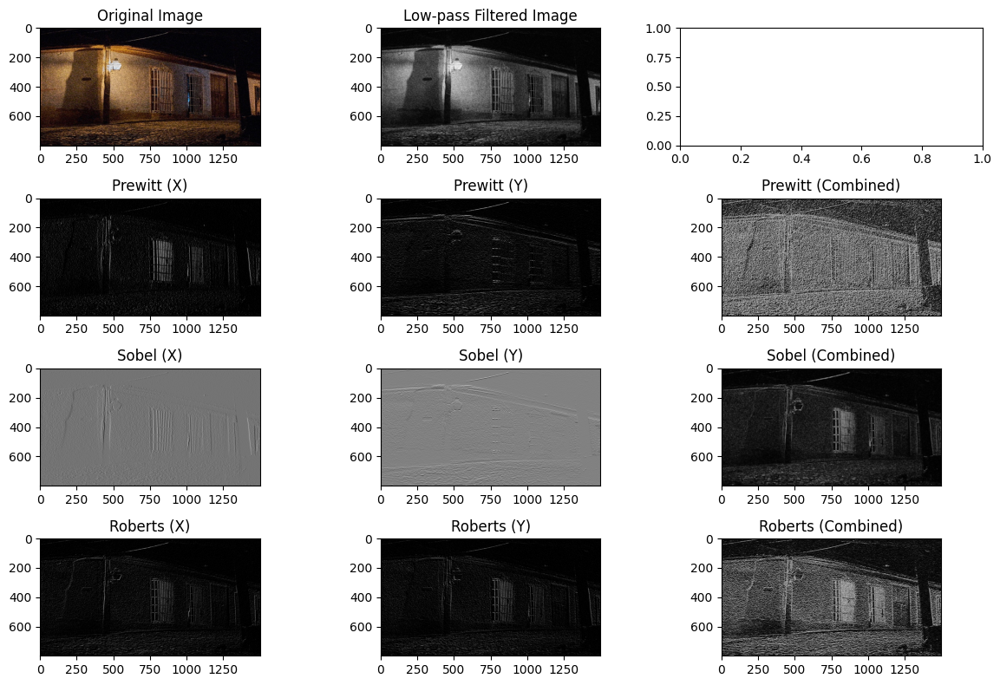

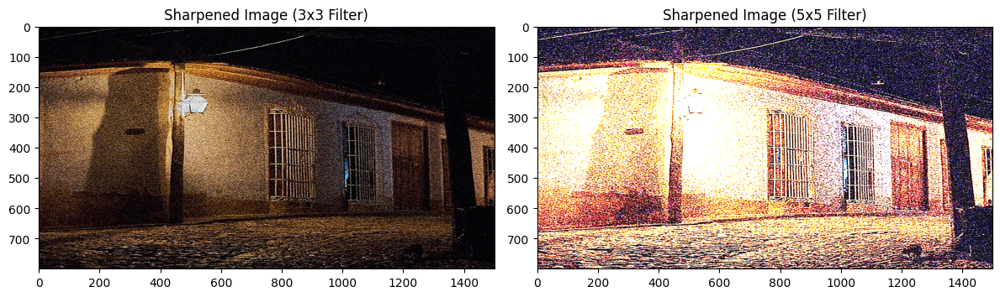

In [11]:
import urllib.request
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/Ex2.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Convert the image to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply a low-pass filter to remove noise
lowpass_img = cv2.GaussianBlur(gray_img, (5, 5), 0)

# Apply edge detection using Prewitt, Sobel, and Roberts operators
prewitt_x = cv2.filter2D(lowpass_img, -1, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
prewitt_y = cv2.filter2D(lowpass_img, -1, np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]))
prewitt = np.sqrt(np.square(prewitt_x) + np.square(prewitt_y))

sobel_x = cv2.Sobel(lowpass_img, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(lowpass_img, cv2.CV_64F, 0, 1, ksize=3)
sobel = np.sqrt(np.square(sobel_x) + np.square(sobel_y))

roberts_x = cv2.filter2D(lowpass_img, -1, np.array([[1, 0], [0, -1]]))
roberts_y = cv2.filter2D(lowpass_img, -1, np.array([[0, 1], [-1, 0]]))
roberts = np.sqrt(np.square(roberts_x) + np.square(roberts_y))

# Define custom sharpening filters
sharpen_3x3 = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], dtype=np.float32)
sharpen_5x5 = np.array([[-1, -1, -1, -1, -1],
                        [-1,  2,  2,  2, -1],
                        [-1,  2,  8,  2, -1],
                        [-1,  2,  2,  2, -1],
                        [-1, -1, -1, -1, -1]], dtype=np.float32)

# Apply sharpening filters
sharpened_3x3 = cv2.filter2D(img, -1, sharpen_3x3)
sharpened_5x5 = cv2.filter2D(img, -1, sharpen_5x5)

# Plot and display the images
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(12, 8))

# Original image
axes[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Original Image')

# Low-pass filtered image
axes[0, 1].imshow(lowpass_img, cmap='gray')
axes[0, 1].set_title('Low-pass Filtered Image')

# Edge detection - Prewitt
axes[1, 0].imshow(prewitt_x, cmap='gray')
axes[1, 0].set_title('Prewitt (X)')

axes[1, 1].imshow(prewitt_y, cmap='gray')
axes[1, 1].set_title('Prewitt (Y)')

axes[1, 2].imshow(prewitt, cmap='gray')
axes[1, 2].set_title('Prewitt (Combined)')

# Edge detection - Sobel
axes[2, 0].imshow(sobel_x, cmap='gray')
axes[2, 0].set_title('Sobel (X)')

axes[2, 1].imshow(sobel_y, cmap='gray')
axes[2, 1].set_title('Sobel (Y)')

axes[2, 2].imshow(sobel, cmap='gray')
axes[2, 2].set_title('Sobel (Combined)')

# Edge detection - Roberts
axes[3, 0].imshow(roberts_x, cmap='gray')
axes[3, 0].set_title('Roberts (X)')

axes[3, 1].imshow(roberts_y, cmap='gray')
axes[3, 1].set_title('Roberts (Y)')

axes[3, 2].imshow(roberts, cmap='gray')
axes[3, 2].set_title('Roberts (Combined)')

# Adjust spacing and display the plots
plt.tight_layout()
plt.show()

# Plot and display the sharpened images
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

# Sharpening filter - 3x3
axes[0].imshow(cv2.cvtColor(sharpened_3x3, cv2.COLOR_BGR2RGB))
axes[0].set_title('Sharpened Image (3x3 Filter)')

# Sharpening filter - 5x5
axes[1].imshow(cv2.cvtColor(sharpened_5x5, cv2.COLOR_BGR2RGB))
axes[1].set_title('Sharpened Image (5x5 Filter)')

# Adjust spacing and display the plots
plt.tight_layout()
plt.show()

3. (10 điểm) - Ảnh màu (Color Image) và Ảnh nhị phân (Binary Image)
Cho ảnh màu JPG tên Ex3.jpg </br>
Biến đổi ảnh trên thành ảnh nhị phân bằng 3 phương pháp: ngưỡng thủ công (manual thresholding),ngưỡng toàn cục (global thresholding) và ngưỡng cục bộ (local thresholding). </br>
So sánh 3 phương pháp và hiển thị biểu đồ tần số.

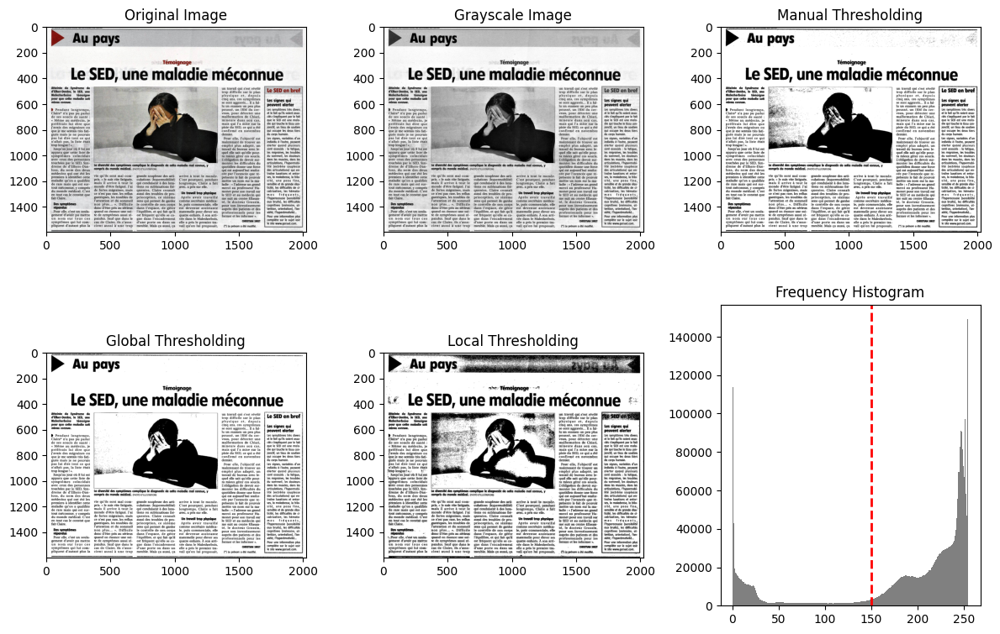

In [13]:
import urllib.request
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/Ex3.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Convert the image to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Manual thresholding
manual_thresh = 150
manual_binary = cv2.threshold(gray_img, manual_thresh, 255, cv2.THRESH_BINARY)[1]

# Global thresholding
_, global_binary = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Local thresholding
block_size = 151
constant = 10
local_binary = cv2.adaptiveThreshold(
    gray_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, block_size, constant
)

# Plot and display the images
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))

# Original image
axes[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Original Image')

# Grayscale image
axes[0, 1].imshow(gray_img, cmap='gray')
axes[0, 1].set_title('Grayscale Image')

# Manual thresholding
axes[0, 2].imshow(manual_binary, cmap='gray')
axes[0, 2].set_title('Manual Thresholding')

# Global thresholding
axes[1, 0].imshow(global_binary, cmap='gray')
axes[1, 0].set_title('Global Thresholding')

# Local thresholding
axes[1, 1].imshow(local_binary, cmap='gray')
axes[1, 1].set_title('Local Thresholding')

# Frequency histogram
axes[1, 2].hist(gray_img.ravel(), bins=256, color='gray')
axes[1, 2].axvline(manual_thresh, color='r', linestyle='--', linewidth=2)
axes[1, 2].set_title('Frequency Histogram')

# Adjust spacing and display the plots
plt.tight_layout()
plt.show()

4. (10 điểm) – Phát hiện Vật thể (Object Detection) và Đánh dấu (Region Labelling)
Cho ảnh nhị phân JPG tên Ex4.jpg </br>
Đổi màu các vật thể trong ảnh như sau: </br>
hình tròn nhỏ (màu nâu), hình tròn lớn (màu xanh lá cây), hình tam giác ngược xuống (màu cam), hình tam giác ngược lên (màu vàng), hình chữ nhật (màu tím), hình vuông (màu đỏ). </br>
Hiển thị ảnh sau khi chỉnh.

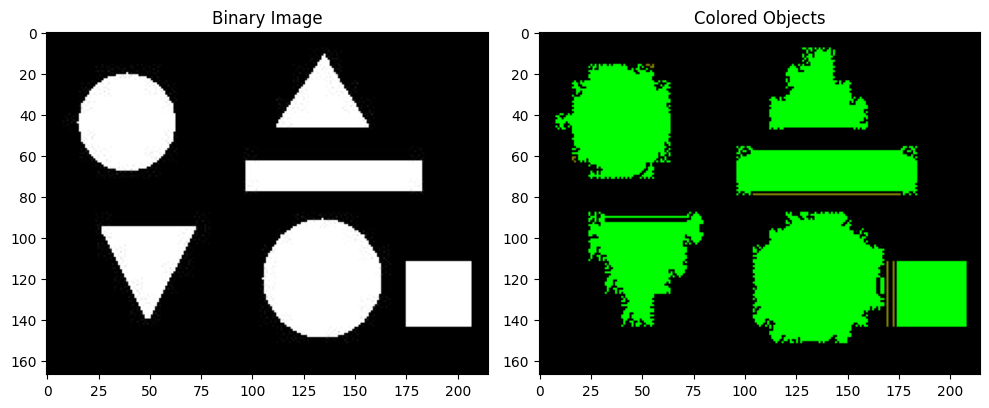

In [17]:
import urllib.request
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the binary image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/Ex4.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
binary_img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)

# Find contours of objects in the binary image
contours, _ = cv2.findContours(binary_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create an output color image of the same size as the binary image
output_img = cv2.cvtColor(binary_img, cv2.COLOR_GRAY2RGB)

# Define colors for different shapes
colors = {
    "circle_small": (0, 128, 128),   # Brown
    "circle_large": (0, 255, 0),     # Green
    "triangle_down": (0, 165, 255),  # Orange
    "triangle_up": (0, 255, 255),    # Yellow
    "rectangle": (128, 0, 128),      # Purple
    "square": (0, 0, 255),           # Red
}

# Iterate over the detected contours and label and color the objects
for contour in contours:
    area = cv2.contourArea(contour)
    perimeter = cv2.arcLength(contour, True)
    shape = ""

    if perimeter == 3:  # Triangle
        shape = "triangle_down" if area > 300 else "triangle_up"
    elif perimeter == 4:  # Rectangle or Square
        shape = "rectangle" if area > 300 else "square"
    elif perimeter > 4:  # Circle
        shape = "circle_large" if area > 500 else "circle_small"

    # Color the object based on its shape
    if shape in colors:
        cv2.drawContours(output_img, [contour], 0, colors[shape], -1)

# Plot and display the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(binary_img, cmap='gray')
plt.title('Binary Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
plt.title('Colored Objects')

plt.tight_layout()
plt.show()

5. (10 điểm) – Xử lý ảnh màu (Color Image Processing) </br>
(a) Biến đổi ảnh thang xám Ex5a.jpg sang ảnh màu giả (pseudo-color), sử dụng 32 thang. </br>
(b) Biến đổi ảnh màu Ex5b.jpg sang các định dạng ảnh HSV, CMY, YCBCR và NTSC. Mỗi loại hiển thị các thành phần của chúng.

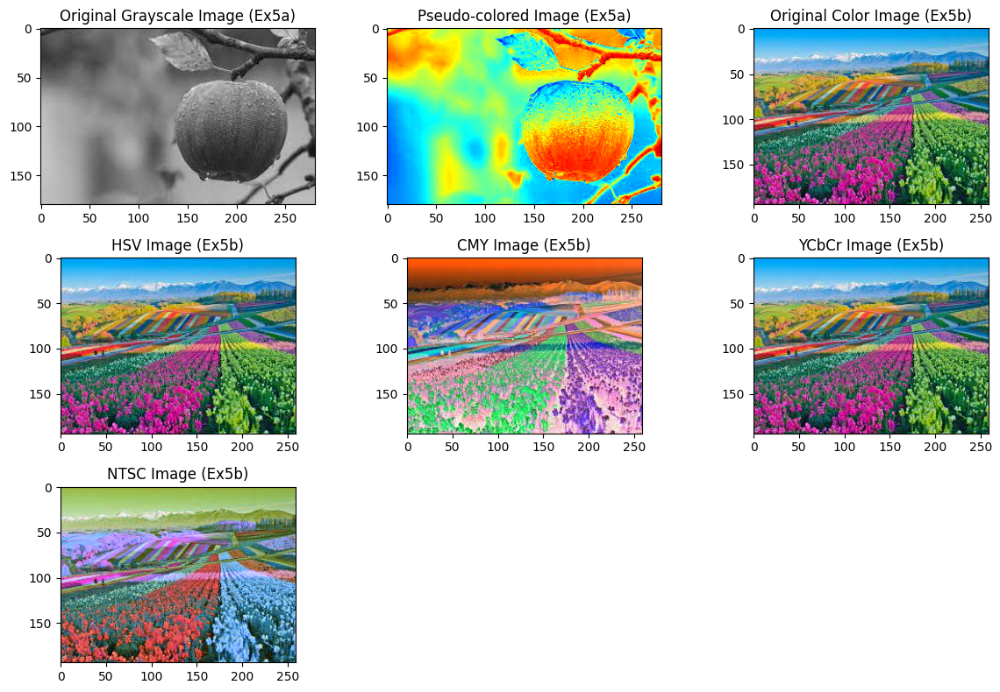

In [24]:
import cv2
import matplotlib.pyplot as plt
import urllib.request
import numpy as np

# Load the original grayscale image from Git repository (Ex5a.jpg)
url_ex5a = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/Ex5a.jpg'
resp_ex5a = urllib.request.urlopen(url_ex5a)
arr_ex5a = np.asarray(bytearray(resp_ex5a.read()), dtype=np.uint8)
original_img_ex5a = cv2.imdecode(arr_ex5a, cv2.IMREAD_GRAYSCALE)

# Load the original color image from Git repository (Ex5b.jpg)
url_ex5b = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/Ex5b.jpg'
resp_ex5b = urllib.request.urlopen(url_ex5b)
arr_ex5b = np.asarray(bytearray(resp_ex5b.read()), dtype=np.uint8)
original_img_ex5b = cv2.imdecode(arr_ex5b, cv2.IMREAD_COLOR)

# Apply pseudo-coloring to the grayscale image (Ex5a.jpg)
pseudo_color_img_ex5a = cv2.applyColorMap(original_img_ex5a, cv2.COLORMAP_JET)

# Convert the color image (Ex5b.jpg) to different color spaces
hsv_img_ex5b = cv2.cvtColor(original_img_ex5b, cv2.COLOR_BGR2HSV)
cmy_img_ex5b = 255 - original_img_ex5b
ycbcr_img_ex5b = cv2.cvtColor(original_img_ex5b, cv2.COLOR_BGR2YCrCb)
ntsc_img_ex5b = cv2.cvtColor(original_img_ex5b, cv2.COLOR_BGR2LAB)

# Display the images
plt.figure(figsize=(12, 8))

# Original grayscale image (Ex5a.jpg)
plt.subplot(3, 3, 1)
plt.imshow(original_img_ex5a, cmap='gray')
plt.title('Original Grayscale Image (Ex5a)')

# Pseudo-colored image (Ex5a.jpg)
plt.subplot(3, 3, 2)
plt.imshow(pseudo_color_img_ex5a)
plt.title('Pseudo-colored Image (Ex5a)')

# Original color image (Ex5b.jpg)
plt.subplot(3, 3, 3)
plt.imshow(cv2.cvtColor(original_img_ex5b, cv2.COLOR_BGR2RGB))
plt.title('Original Color Image (Ex5b)')

# HSV image (Ex5b.jpg)
plt.subplot(3, 3, 4)
plt.imshow(cv2.cvtColor(hsv_img_ex5b, cv2.COLOR_HSV2RGB))
plt.title('HSV Image (Ex5b)')

# CMY image (Ex5b.jpg)
plt.subplot(3, 3, 5)
plt.imshow(cv2.cvtColor(cmy_img_ex5b, cv2.COLOR_BGR2RGB))
plt.title('CMY Image (Ex5b)')

# YCbCr image (Ex5b.jpg)
plt.subplot(3, 3, 6)
plt.imshow(cv2.cvtColor(ycbcr_img_ex5b, cv2.COLOR_YCrCb2RGB))
plt.title('YCbCr Image (Ex5b)')

# NTSC image (Ex5b.jpg)
plt.subplot(3, 3, 7)
plt.imshow(cv2.cvtColor(ntsc_img_ex5b, cv2.COLOR_YCrCb2RGB))
plt.title('NTSC Image (Ex5b)')

plt.tight_layout()
plt.show()